## Interactive Viz of Gaia DR2

The [all-sky view of radial velocities of stars](http://sci.esa.int/gaia/60223-gaia-s-all-sky-map-of-radial-velocities/) in the Milky Way by the Gaia team, released as part of DR2, is a thing of beauty:

<img src="http://sci.esa.int/science-e-media/img/3f/ESA_Gaia_DR2_Average_Rad_Vel_625.jpg">

Here I attempt to recreate this view and make it interactive.

-Josh Bloom (UC Berkeley, rev Apr 26, 2018)

## Get the data

I downloaded the sources with radial velocities CSV files and made them queriable using AWS Glue and Athena. 
You can [get the data](https://berkeley.box.com/s/js3akqwzbzw1gvvg1zp739ijt9a5h5wr) from my Box folder and then:

```python
df = pd.read_parquet("sources_with_rvs_sig_parallax_10.p")
```

In [195]:
import io
import os
import logging
import hashlib
import time 
import json 
import datetime

import pandas as pd
import numpy as np

Here's where I make the SQL query for sources with significant parallax:

In [211]:
%run aq 

In [212]:
sql = '''SELECT l, b, radial_velocity as pv, parallax as p FROM rvssources_with_rv 
         where parallax_over_error > 10'''

logging.debug("SQL Query: {}".format(sql))

try:
    rez = query_athena(sql)  # this wont work for you unless you have the athena query code, which you dont ;)
    df = pd.read_csv(rez)
    df.to_parquet("sources_with_rvs_sig_parallax_10.p")
except:
    df = pd.read_parquet("sources_with_rvs_sig_parallax_10.p")  # get this in the Box folder (see above)

In [84]:
len(df)

5393494

Wow. More than 5M stars with better than 10 $\sigma$ parallaxes and radial velocity measures.

In [5]:
#!conda install holoviews colorcet -y

In [6]:
#!conda install -c conda-forge cartopy -y

In [199]:
#!pip install PyAstronomy

Convert the `l`, `b` coordinates to an aitoff project coordinate space:

In [213]:
from PyAstronomy.pyasl import aitoff

x, y, = aitoff(df["l"].values, df["b"].values)
df["x"] = -x
df["y"] = y
df["d"] = 1000 / df["p"]  # get the distance in parsecs


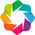

In [214]:
import holoviews as hv
import datashader.transfer_functions as tf
%matplotlib inline
hv.extension('bokeh', 'matplotlib', width="100")

In [215]:
import holoviews as hv
from colorcet import fire, coolwarm, b_diverging_bkr_55_10_c35
from holoviews.operation.datashader import datashade
import geoviews as gv
import geoviews.feature as gf

import holoviews.operation.datashader as hd

options = dict(width=900, height=600, xaxis=None, yaxis=None, bgcolor='black')
points = hv.Points(df, kdims=['x', 'y'])
rvs = datashade(points, cmap=coolwarm, aggregator=ds.mean('pv')).opts(plot=options)

In [216]:
%%opts QuadMesh [tools=['hover']] (alpha=0 hover_alpha=0.2)
from holoviews.streams import RangeXY

(rvs * hv.util.Dynamic(hd.aggregate(points, width=30, height=30, streams=[RangeXY]), 
                       operation=hv.QuadMesh)).relabel("Gaia RV")

:DynamicMap   []

Add a hover tool (TODO: convert back to l,b)

In [217]:
%%opts QuadMesh [tools=['hover']] (alpha=0 hover_alpha=0.2)

import holoviews as hv
import cartopy.crs as ccrs
from colorcet import fire, coolwarm, b_diverging_bkr_55_10_c35
from holoviews.operation.datashader import datashade
import geoviews as gv
import geoviews.feature as gf

import holoviews.operation.datashader as hd

options = dict(width=900, height=600, xaxis=None, yaxis=None, bgcolor='black')
points = hv.Points(df, kdims=['x', 'y'])
rvs = datashade(points, cmap=coolwarm, aggregator=ds.mean('pv')).opts(plot=options)

from holoviews.streams import RangeXY

(rvs * hv.util.Dynamic(hd.aggregate(points, width=30, height=30, streams=[RangeXY]), 
                       operation=hv.QuadMesh)).relabel("Gaia RV")


:DynamicMap   []

In [218]:
%%opts Points [tools=['hover']] (size=5)

import param, parambokeh
from colorcet import cm_n
from holoviews.streams import RangeXY

opts = dict(width=900,height=600,xaxis=None,yaxis=None,bgcolor='black', show_grid=False)


class GaiaExplorer(hv.streams.Stream):
    distance_range = param.Range(default=(3,3000),bounds=(3,3000), doc="Distance [pc]")
    rv_range = param.Range(default=(-300,300),bounds=(min(df["pv"]),max(df["pv"])), doc="Radial Velocity [km/s]")
    
    def make_view(self, x_range, y_range, **kwargs):
        df_filt = df[ (df["d"] < self.distance_range[1]) &  (df["d"] >= self.distance_range[0])]
        df_filt = df_filt[ (df_filt["pv"] < self.rv_range[1]) &  (df_filt["pv"] >= self.rv_range[0]) ]
        points = hv.Points(df_filt, ['x', 'y'])
        rvs_1 = datashade(points, cmap=coolwarm, aggregator=ds.mean('pv'), dynamic=False, 
                          width=1900, height=1600).opts(plot=opts) 
        return rvs_1

In [210]:
explorer = GaiaExplorer(name="Gaia RVs")
parambokeh.Widgets(explorer, callback=explorer.event)
dmap = hv.DynamicMap(explorer.make_view, streams=[explorer, RangeXY()])
dmap

:DynamicMap   []